# 2025-10-20: Add in CD8+ Central Memory T Cells
### By [Aishwarya Chander](aishwarya.chander@alleninstitute.org), High Resolution Translational Immunology, Allen Institute for Immunology

**Main Aim:** Upon conducting StarCat and cNMF analysis on the T cell subsets, it has come to our attention that the CD8+ Central Memory population is currently mislabelled as CD8+ Naive T cells. To fix this, a new population will be assigned by subclustering the Naive population into 2 groups and annotating the memory population as central memory. 

This may have happend because in the presence of just the CD8+ T cells, the central memory population was not distinguishable. In the broader context of all T cells, this population became far more apparent. 

**Markers:** CD8+ Central Memory (positive) `['TCF7', 'CCR7', 'SELL', 'IL7R', 'LEF1', 'BCL2']`, (negative) `['GZMB', 'GXMK']`

## 1. Imports

In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import scanpy.external as sce

sc.settings.n_jobs = 30
sc.settings.verbosity = 0

plt.rcParams["figure.dpi"] = 150
plt.rcParams["figure.figsize"] = (7, 5)

## 2. Correct CD8 T cell annotation

In [2]:
adata = sc.read_h5ad('../../../data/rna/bmmc-celltypes/bmmc-t_cell-processed-harmony.h5ad')

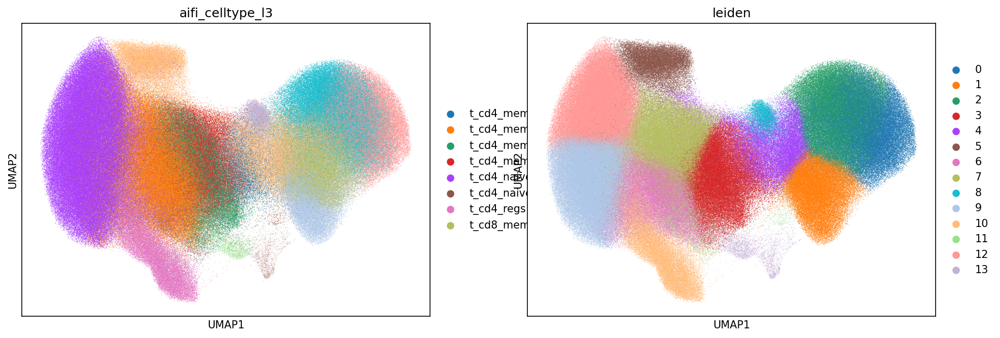

In [3]:
sc.pl.umap(adata, color=['aifi_celltype_l3', 'leiden'], size=1)

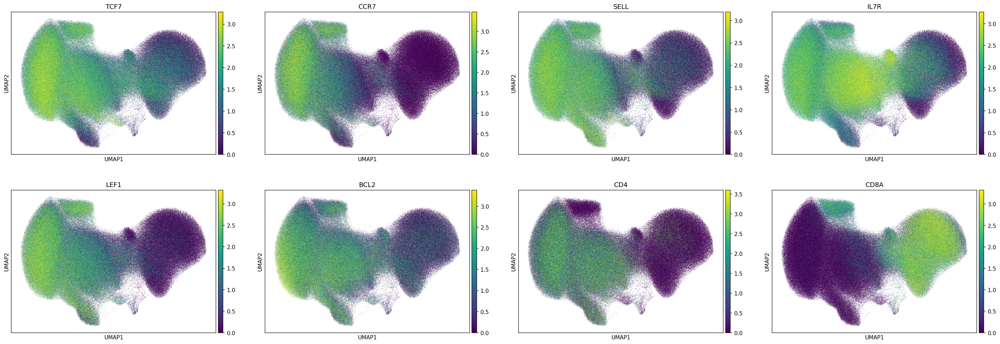

In [4]:
sc.pl.umap(adata, 
           color=['TCF7', 'CCR7', 'SELL', 'IL7R', 'LEF1', 'BCL2', 'CD4', 'CD8A'], 
           use_raw=False, 
           vmax='p99', 
           size=1)

In [5]:
adata.obs['aifi_celltype_l3'] = adata.obs['aifi_celltype_l3'].cat.add_categories(['t_cd8_memory_central'])
adata.obs.loc[(adata.obs['aifi_celltype_l3'] == 't_cd8_naive-core') & (adata.obs['leiden'] != '5'), 'aifi_celltype_l3'] = 't_cd8_memory_central'

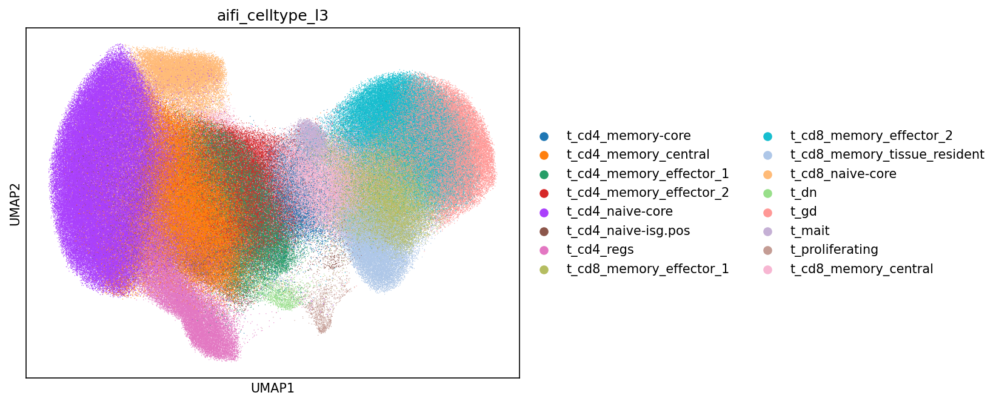

In [6]:
sc.pl.umap(adata, color='aifi_celltype_l3', size=1.5)

In [7]:
adata.obs[["cell_uuid", "aifi_celltype_l3"]].to_parquet(
    "../../../data/rna/bmmc-labels/t_cells_corrected.parquet"
)

In [8]:
adata.obs['aifi_celltype_l3'].value_counts()

t_cd4_naive-core                173339
t_cd4_memory_central             78785
t_cd8_memory_effector_2          58345
t_gd                             38217
t_cd8_memory_effector_1          36235
t_cd4_memory_effector_2          33992
t_cd8_memory_central             32822
t_cd4_memory_effector_1          29376
t_cd4_regs                       29192
t_cd8_memory_tissue_resident     25471
t_cd8_naive-core                 21785
t_cd4_naive-isg.pos              11530
t_cd4_memory-core                11278
t_mait                            9407
t_dn                              2299
t_proliferating                   1330
Name: aifi_celltype_l3, dtype: int64